In [1]:
#mount google drive
from google.colab import drive 
drive.mount('/content/drive')

%cd /content/drive/My\ Drive/Colab Notebooks/EG_starcraft

Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks/EG_starcraft


##Load

In [2]:
import pandas as pd
import numpy as np

In [3]:
df = pd.read_csv('starcraft_player_data.csv')

In [4]:
df.head()

,GameID,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
0,52,5,27,10,3000,143.7180,0.003515,0.000220,7,0.000110,0.000392,0.004849,32.6677,40.8673,4.7508,28,0.001397,6,0.0,0.000000
1,55,5,23,10,5000,129.2322,0.003304,0.000259,4,0.000294,0.000432,0.004307,32.9194,42.3454,4.8434,22,0.001193,5,0.0,0.000208
2,56,4,30,10,200,69.9612,0.001101,0.000336,4,0.000294,0.000461,0.002926,44.6475,75.3548,4.0430,22,0.000745,6,0.0,0.000189
3,57,3,19,20,400,107.6016,0.001034,0.000213,1,0.000053,0.000543,0.003783,29.2203,53.7352,4.9155,19,0.000426,7,0.0,0.000384
4,58,3,32,10,500,122.8908,0.001136,0.000327,2,0.000000,0.001329,0.002368,22.6885,62.0813,9.3740,15,0.001174,4,0.0,0.000019


##EDA

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use('ggplot')

In [ ]:
df.shape

(3395, 20)

In [5]:
df.columns

Index(['GameID', 'LeagueIndex', 'Age', 'HoursPerWeek', 'TotalHours', 'APM',
       'SelectByHotkeys', 'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks',
       'MinimapRightClicks', 'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency',
       'ActionsInPAC', 'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade',
       'ComplexUnitsMade', 'ComplexAbilitiesUsed'],
      dtype='object')

In [ ]:
df.dtypes

GameID                    int64
LeagueIndex               int64
Age                      object
HoursPerWeek             object
TotalHours               object
APM                     float64
SelectByHotkeys         float64
AssignToHotkeys         float64
UniqueHotkeys             int64
MinimapAttacks          float64
MinimapRightClicks      float64
NumberOfPACs            float64
GapBetweenPACs          float64
ActionLatency           float64
ActionsInPAC            float64
TotalMapExplored          int64
WorkersMade             float64
UniqueUnitsMade           int64
ComplexUnitsMade        float64
ComplexAbilitiesUsed    float64
dtype: object

In [ ]:
df.describe()

,GameID,LeagueIndex,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
count,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000,3395.000000
mean,4805.012371,4.184094,117.046947,0.004299,0.000374,4.364654,0.000098,0.000387,0.003463,40.361562,63.739403,5.272988,22.131664,0.001032,6.534021,0.000059,0.000142
std,2719.944851,1.517327,51.945291,0.005284,0.000225,2.360333,0.000166,0.000377,0.000992,17.153570,19.238869,1.494835,7.431719,0.000519,1.857697,0.000111,0.000265
min,52.000000,1.000000,22.059600,0.000000,0.000000,0.000000,0.000000,0.000000,0.000679,6.666700,24.093600,2.038900,5.000000,0.000077,2.000000,0.000000,0.000000
25%,2464.500000,3.000000,79.900200,0.001258,0.000204,3.000000,0.000000,0.000140,0.002754,28.957750,50.446600,4.272850,17.000000,0.000683,5.000000,0.000000,0.000000
50%,4874.000000,4.000000,108.010200,0.002500,0.000353,4.000000,0.000040,0.000281,0.003395,36.723500,60.931800,5.095500,22.000000,0.000905,6.000000,0.000000,0.000020
75%,7108.500000,5.000000,142.790400,0.005133,0.000499,6.000000,0.000119,0.000514,0.004027,48.290500,73.681300,6.033600,27.000000,0.001259,8.000000,0.000086,0.000181
max,10095.000000,8.000000,389.831400,0.043088,0.001752,10.000000,0.003019,0.004041,0.007971,237.142900,176.372100,18.558100,58.000000,0.005149,13.000000,0.000902,0.003084


In [ ]:
#check for duplicates and na's

print('\nNull Values in df \n{}'.format(df.isna().sum()))
print('Duplicated values in df {}'.format(df.duplicated().sum()))


Null Values in df 
GameID                  0
LeagueIndex             0
Age                     0
HoursPerWeek            0
TotalHours              0
APM                     0
SelectByHotkeys         0
AssignToHotkeys         0
UniqueHotkeys           0
MinimapAttacks          0
MinimapRightClicks      0
NumberOfPACs            0
GapBetweenPACs          0
ActionLatency           0
ActionsInPAC            0
TotalMapExplored        0
WorkersMade             0
UniqueUnitsMade         0
ComplexUnitsMade        0
ComplexAbilitiesUsed    0
dtype: int64
Duplicated values in df 0


GameID column does not appear to be useful for predictions.

In [6]:
df.drop(['GameID'], axis=1, inplace=True)

Want dtypes to be numeric for age, hourperweek and totalhours. Looking at the dataset we can see that all the pro players are missing values for these columns(about 2% of the total data). We can use the average age of Starcraft II pro players according to ESPN https://www.espn.com/esports/story/_/id/20733853/the-average-age-esports-versus-nfl-nba-mlb-nhl to fill the pro player ages. Additionally we can use [this](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3687044/) online study on starcraft player brain activations to approximate HoursPerWeek. I filled TotalHours with a large value that is consistent with WeeklyHours for pro players.

In [ ]:
df.query('Age == "?"').head()

,LeagueIndex,Age,HoursPerWeek,TotalHours,APM,SelectByHotkeys,AssignToHotkeys,UniqueHotkeys,MinimapAttacks,MinimapRightClicks,NumberOfPACs,GapBetweenPACs,ActionLatency,ActionsInPAC,TotalMapExplored,WorkersMade,UniqueUnitsMade,ComplexUnitsMade,ComplexAbilitiesUsed
3340,8,?,?,?,189.7404,0.004582,0.000655,4,0.000073,0.000618,0.006291,23.5130,32.5665,4.4451,25,0.002218,6,0.000000,0.0
3341,8,?,?,?,287.8128,0.029040,0.001041,9,0.000231,0.000656,0.005399,31.6416,36.1143,4.5893,34,0.001138,6,0.000058,0.0
3342,8,?,?,?,294.0996,0.029640,0.001076,6,0.000302,0.002374,0.006294,16.6393,36.8192,4.1850,26,0.000987,6,0.000000,0.0
3343,8,?,?,?,274.2552,0.018121,0.001264,8,0.000053,0.000975,0.007111,10.6419,24.3556,4.3870,28,0.001106,6,0.000000,0.0
3344,8,?,?,?,274.3404,0.023131,0.000739,8,0.000622,0.003552,0.005355,19.1568,36.3098,5.2811,28,0.000739,6,0.000000,0.0


In [7]:
#replace the ?'s as described earlier, change dtype to int
df['Age'] = df['Age'].apply(lambda x: 23 if x=='?' else x)
df['HoursPerWeek'] = df['HoursPerWeek'].apply(lambda x: 50 if x=='?' else x)
df['TotalHours'] = df['TotalHours'].apply(lambda x: 12000 if x=='?' else x)

df['Age'] = pd.to_numeric(df['Age'], errors='coerce')
df['HoursPerWeek'] = pd.to_numeric(df['HoursPerWeek'], errors='coerce')
df['TotalHours'] = pd.to_numeric(df['TotalHours'], errors='coerce')

We have imbalanced data, which is to be expected since we might assume that rank is approximately normally distributed. The two highest ranks account for less than 5% of the total number of players in the dataset. It might be useful to do some upsampling or downweighting depending how we model.

<Axes: title={'center': 'Rank Counts'}>

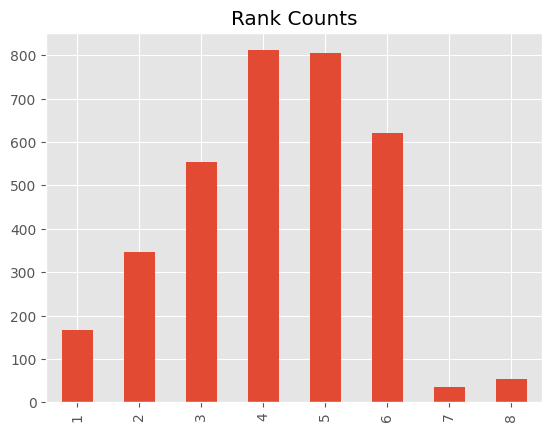

In [ ]:
df['LeagueIndex'].value_counts(sort=False).sort_index().plot(kind='bar', title='Rank Counts')

Selected scatter plots for direct relationships between features and LeagueIndex. Higher rank players have a higher APM, lower ActionLatency and lower GapBetweenPACs. Total hours appears to be have inaccuracies as one player has around one million hours(over 100 years) and some of the top rated players have barely any hours relative to the lower ranked players.

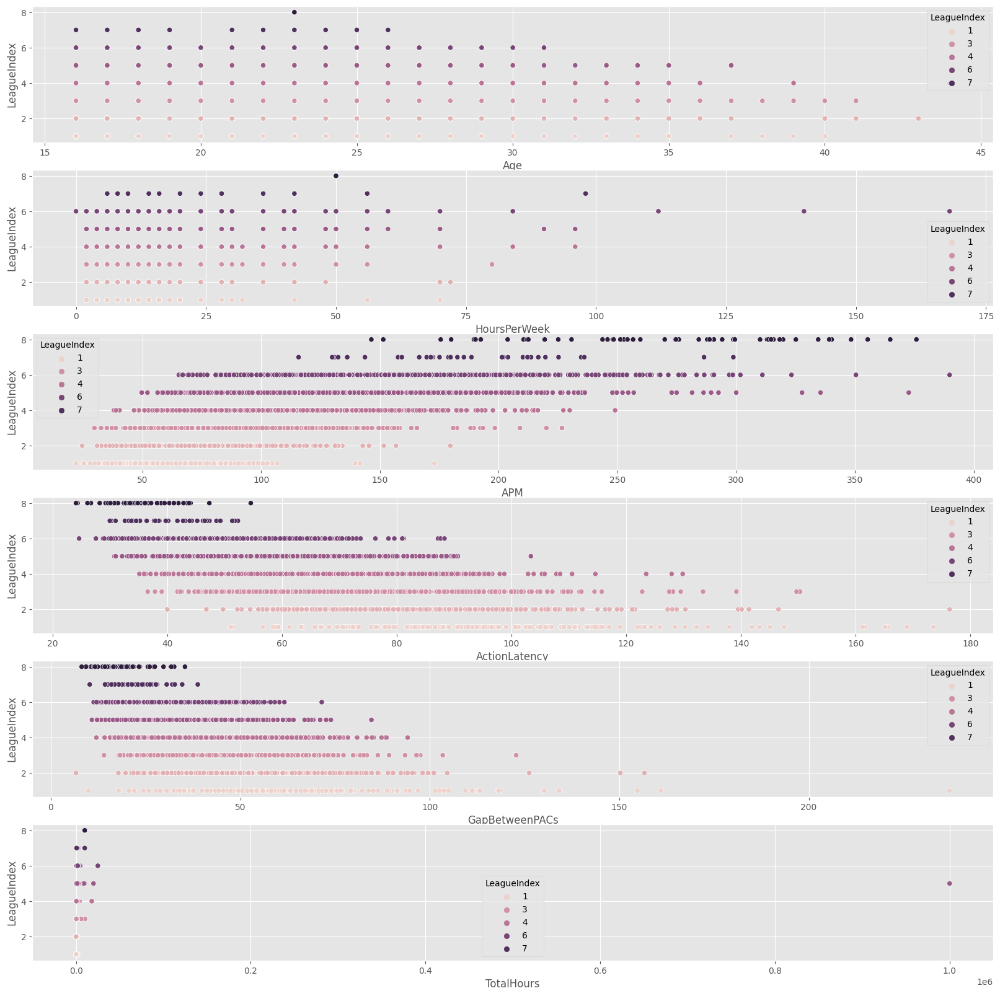

In [ ]:
cols = ['Age', 'HoursPerWeek', 'APM',
        'ActionLatency', 'GapBetweenPACs', 'TotalHours']

figure, axis = plt.subplots(6, figsize=(20,20))

for i,col in enumerate(cols):
  ax = axis[i]
  sns.scatterplot(x=df[col], y=df['LeagueIndex'], hue=df['LeagueIndex'], ax=ax)


Remove the extreme outlier with a million total hours. Take a closer look at the TotalHours vs LeagueIndex scatter now that it's updated. There are some strange values still, so this column might need more attention.

In [8]:
df.query('TotalHours > 30000')
df.drop(1793, inplace=True)

<Axes: xlabel='TotalHours', ylabel='LeagueIndex'>

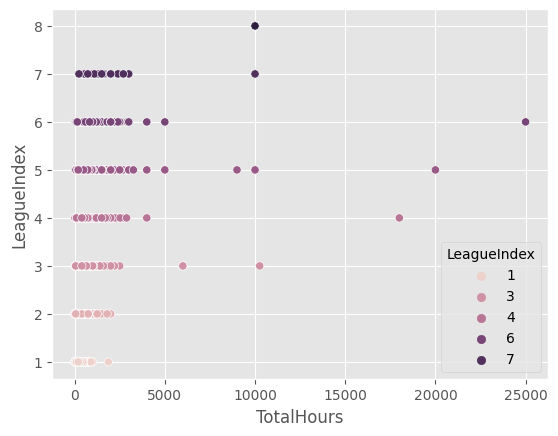

In [ ]:
sns.scatterplot(x=df['TotalHours'], y=df['LeagueIndex'], hue=df['LeagueIndex'])

Stats from TotalHours grouped by LeagueIndex that are not pro. Some of the min values dont seem plausible and the variances are high.

In [26]:
df.query('LeagueIndex != 8').groupby('LeagueIndex')['TotalHours'].agg(['mean', 'median', 'min', 'max','std'])

,mean,median,min,max,std
LeagueIndex,,,,,
1,264.191617,200.0,12,1870,265.060164
2,331.409222,250.0,10,2000,289.403722
3,493.792043,400.0,3,10260,624.206083
4,588.006165,500.0,7,18000,741.306772
5,809.556522,700.0,25,20000,1078.127485
6,988.405797,800.0,50,25000,1119.938623
7,1581.028571,1250.0,240,10000,1652.020679


Pairplots. Some of the individual features are heavily skewed suggesting either we use transformations or models that don't rely on normality or linearity.

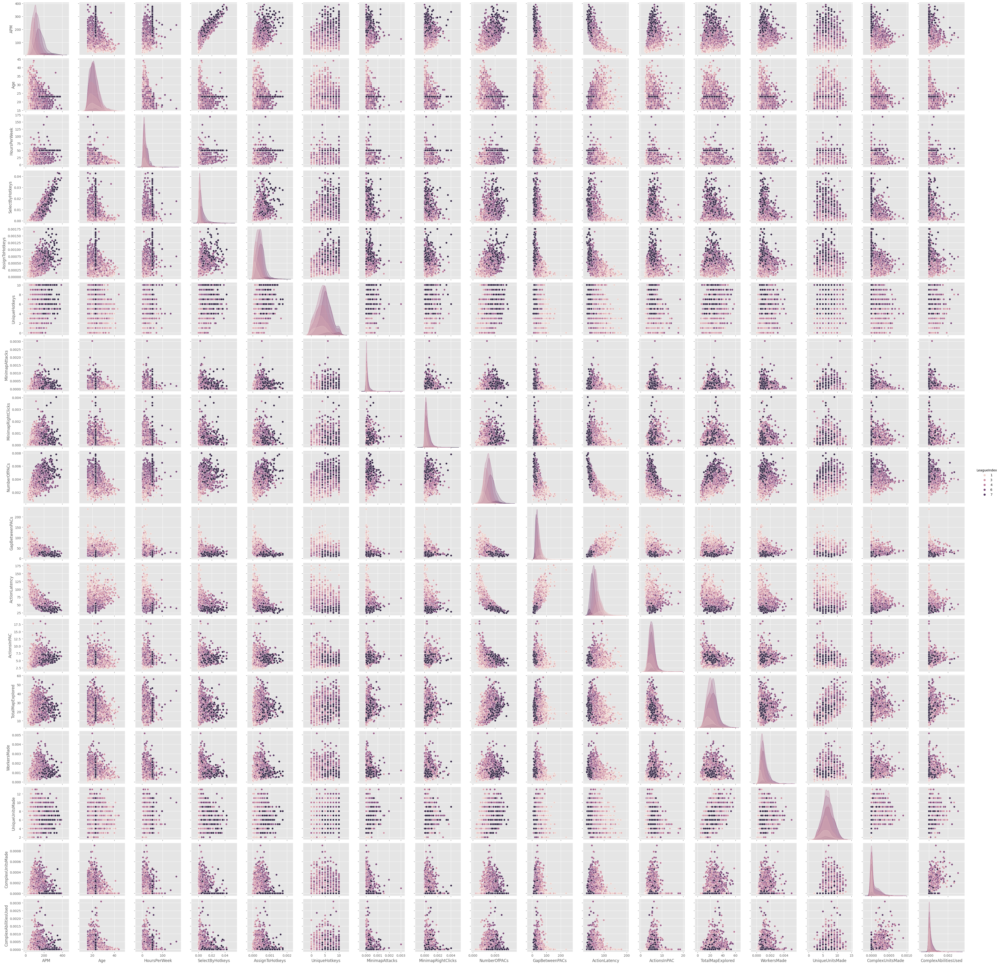

In [ ]:
sns.pairplot(df, hue='LeagueIndex', vars=['APM', 'Age', 'HoursPerWeek',
       'SelectByHotkeys', 'AssignToHotkeys', 'UniqueHotkeys', 'MinimapAttacks',
       'MinimapRightClicks', 'NumberOfPACs', 'GapBetweenPACs', 'ActionLatency',
       'ActionsInPAC', 'TotalMapExplored', 'WorkersMade', 'UniqueUnitsMade',
       'ComplexUnitsMade', 'ComplexAbilitiesUsed'])

Correlation Heatmap

Observe how individually features like APM and ActionLatency may individually be good predictors of LeagueIndex.  

In general we can also drop highly correlated features, though there aren't any that are too high here.

<Axes: >

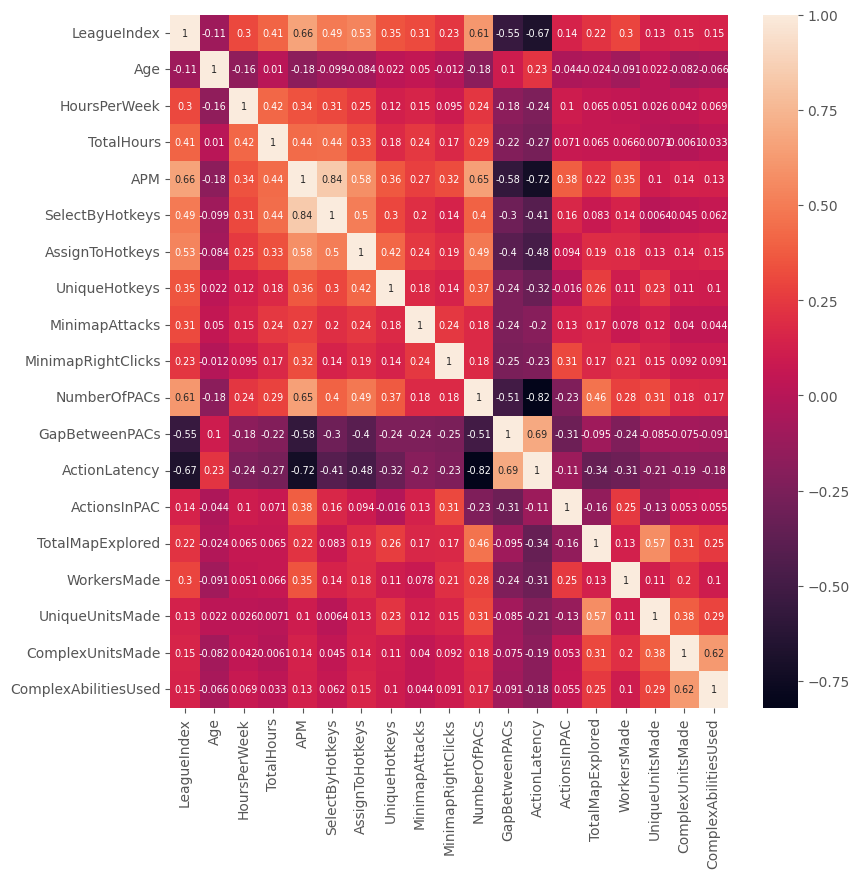

In [ ]:
plt.figure(figsize=(9, 9))
df_corr = df.corr()
sns.heatmap(df_corr, annot=True, annot_kws={'size': 'x-small'})

##Feature Engineering

Here I came up with some features that I thought may help the models pick up on important relationships in the data. F1 is intended to measure how well players use complex units. F2 was redundant so I removed it. F3 is meant to measure the quantity and quality of PACs. F4 is supposed to combine number of hotkeys with frequent usage. F5 is a combination of strong individual predictors in the model. F6 is an indicator function for a very high value in TotalHours.

In [9]:
f1 = df['ComplexUnitsMade']/df['GapBetweenPACs']

f3 = df['ActionsInPAC']*df['NumberOfPACs']/df['ActionLatency']

f4 = df['AssignToHotkeys']*df['SelectByHotkeys']*df['APM']

f5 = np.log(df['TotalHours'])*df['APM']*df['AssignToHotkeys']/df['GapBetweenPACs']

f6 = [1 if x >= 11000 else 0 for x in df['TotalHours']]


df2 = df[['LeagueIndex','APM','NumberOfPACs','ActionLatency','ActionsInPAC','GapBetweenPACs','ComplexUnitsMade']]
df2['f1'] = f1
#df2['f2'] = f2
df2['f3'] = f3
df2['f4'] = f4
df2['f5'] = f5
df2['f6'] = f6

<ipython-input-9-f673e53c7650>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['f1'] = f1
<ipython-input-9-f673e53c7650>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['f3'] = f3
<ipython-input-9-f673e53c7650>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-cop

Checking for rendundancies in the features created.

<Axes: >

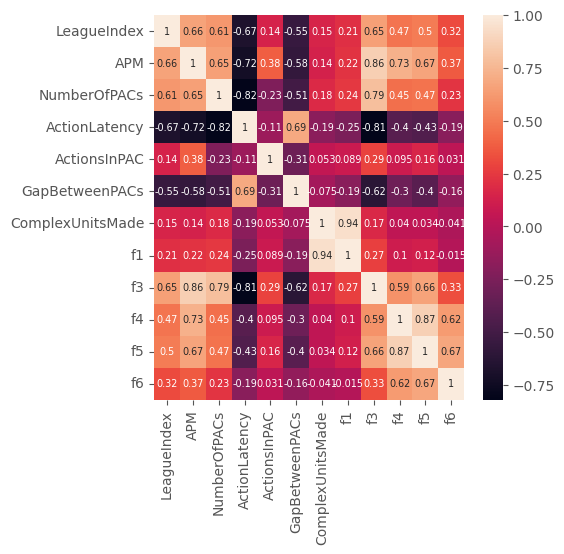

In [29]:
plt.figure(figsize=(5, 5))
df2_corr = df2.corr()
sns.heatmap(df2_corr, annot=True, annot_kws={'size': 'x-small'})

In [10]:
#join new features

df['f1'] = f1
#df['f2'] = f2
df['f3'] = f3
df['f4'] = f4
df['f5'] = f5
df['f6'] = f6

#df['fpc1'] = pc1
#df['pc2'] = pca.components_[1]@df

##Modeling

From the EDA it can be seen that the data has many outliers, has imbalances, does not appear to be linear and has some skewed features. Variants of decision trees and random forests are robust to outliers and imbalanced data, and they make no assumptions of linearity, scale or normality.

Moreover, I will frame this as a regression problem since most game ranking systems have some underlying numerical value, simliar to an ELO system, which can be assumed to be continuous. We can preserve the ordered nature of the ranks this way. If we want, we can convert our outputs later into discrete values at the end for classification.

In [12]:
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.ensemble import VotingRegressor
from sklearn.metrics import accuracy_score, mean_absolute_error

In [13]:
#80/20 train test split

y = df['LeagueIndex'] 
X = df.drop(columns=['LeagueIndex'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

Grid Search Cross Validation will help determine good parameters for the random 
forest model and help prevent overfitting. Scoring is done with mean average precision since this is our distance from the correct rank.

In [16]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 1000, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['sqrt']
# Maximum number of levels in tree
max_depth = [5,15]
# Minimum number of samples required to split a node
min_samples_split = [2, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 10]
# Method of selecting samples for training each tree
bootstrap = [True, False]

In [17]:
param_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [18]:
rf_Model = RandomForestRegressor()

Train the model with 5 folds on X_train for cross validation.

In [19]:
rf_Grid = GridSearchCV(estimator=rf_Model,
                       param_grid=param_grid, 
                       cv = 5,
                       scoring ='neg_mean_absolute_error', 
                       verbose=2, 
                       n_jobs=4)
rf_Grid.fit(X_train, y_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits


GridSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=4,
             param_grid={'bootstrap': [True, False], 'max_depth': [5, 15],
                         'max_features': ['sqrt'], 'min_samples_leaf': [1, 10],
                         'min_samples_split': [2, 10],
                         'n_estimators': [1000, 1111, 1222, 1333, 1444, 1555,
                                          1666, 1777, 1888, 2000]},
             scoring='neg_mean_absolute_error', verbose=2)

In [20]:
#parameters we will use
rf_Grid.best_params_

{'bootstrap': False,
 'max_depth': 15,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 1222}

In [21]:
#declare best rf model and predict with it
rf_Model_best = rf_Grid.best_estimator_
prediction = rf_Model_best.predict(X_test)

In [ ]:
#tried ensembling different random forest variants but it didnt do any better

"""
r1 = RandomForestRegressor(n_estimators=1000, 
                           max_depth=15, 
                           max_features='sqrt',
                           min_samples_leaf=5,
                           criterion='neg_mean_absolute_error')

r2 = GradientBoostingRegressor(n_estimators=1000,
                               learning_rate=0.03,
                               max_depth=20,
                               max_features='sqrt',
                               min_samples_leaf=5,
                               min_samples_split=5,
                               loss='huber')

r3 = AdaBoostRegressor(n_estimators=1000)

r4 = xgb.XGBRegressor(colsample_bytree=0.460,
                      gamma=0.047,
                      learning_rate=0.05,
                      max_depth=20,
                      min_child_weight=1.7,
                      n_estimators=1000,
                      reg_alpha=0.45,
                      reg_lambda=0.85,
                      subsample=0.52, 
                      silent=1, 
                      nthread = -1)


er = VotingRegressor([('rf', r1), ('gb', r2), ('ada', r3), ('xgb', r4)])
"""

##Model Evaluation



MAE: 0.716

ACC: 0.440

The best random forest we have performs significantly better than the baseline. On average of guesses are around 0.716 off from the correct rank and we get the correct rank 44.0% of the time.

In [22]:
#round for discrete predictions
pred_rounded = np.round(prediction, 0)

print(mean_absolute_error(y_test, prediction))
print(accuracy_score(y_test, pred_rounded))

0.7157049034850145
0.44035346097201766


How well does predicting the rounded average do. The models chosen are around 23% more accurate and have around a half rank better guess.

In [15]:
baseline_y = np.full((len(y_test),1),4.0)
print(mean_absolute_error(y_test, baseline_y))
print(accuracy_score(y_test,baseline_y))

1.235640648011782
0.21649484536082475


Let's check the accuracy by each rank.

In [23]:
d = {y:[0,0] for y in range(1,9)}

for i,y in enumerate(y_test):
  d[y][1]+=1
  if int(y) == int(pred_rounded[i]):
    d[y][0]+=1

d

{1: [1, 33],
 2: [19, 74],
 3: [60, 113],
 4: [75, 147],
 5: [90, 170],
 6: [44, 127],
 7: [1, 5],
 8: [9, 10]}

The model accuracies almost resemble the player rank distribution with the exception being that it predicts pro players ver well, probably due to the indicator function feature added.

In [24]:
acc_dict = {y:d[y][0]/d[y][1] for y in d}
acc_dict

{1: 0.030303030303030304,
 2: 0.25675675675675674,
 3: 0.5309734513274337,
 4: 0.5102040816326531,
 5: 0.5294117647058824,
 6: 0.3464566929133858,
 7: 0.2,
 8: 0.9}

Plot Accuracies 

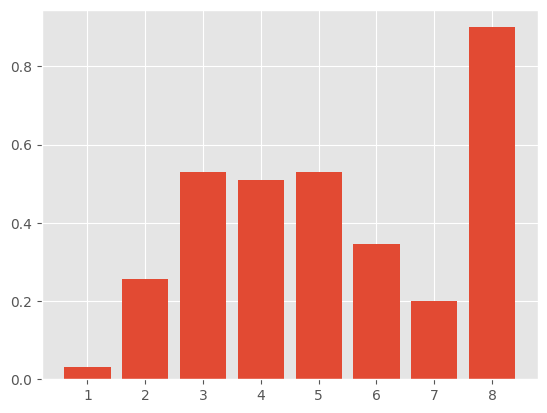

In [35]:
plt.bar(*zip(*acc_dict.items()))
plt.show()

Here we can see what features were used by the random forest to split the data. The features with high correlation with LeagueIndex were used alot and so were some of the engineered features. If we want to train again, we can probably remove F4.

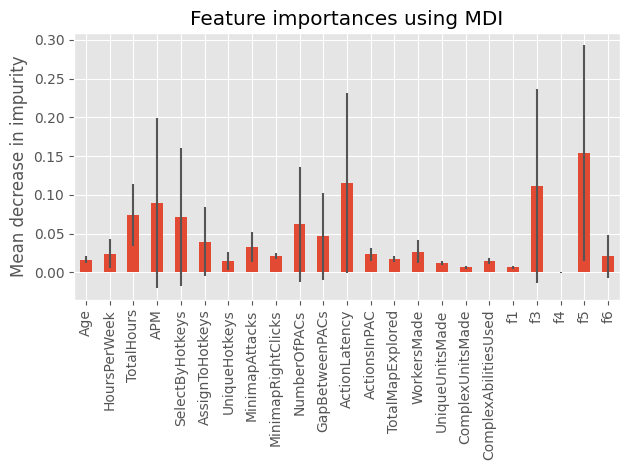

In [28]:
importances = rf_Model_best.feature_importances_
forest_importances = pd.Series(importances, index=X_train.columns)
std = np.std([tree.feature_importances_ for tree in rf_Model_best.estimators_], axis=0)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

##Communicating Findings for Non-Technical Stakeholders

Our goal was to predict player rank given a dataset containing player performance and some player history data taken from around 3500 Starcraft II games. Using a random forest, which is a machine learning model composed of many different decision trees, we were able to predict player rank with a mean average error of 0.716, meaning we were usually less than one rank off. This is about half a rank better than guessing the mean rank everytime. The rounded model was 44% accurate in predicting the exact rank, which is around 23% better than guessing the mean rank everytime. The model accuracy on each rank is plotted below.

                                Model Accuracy By Player Rank

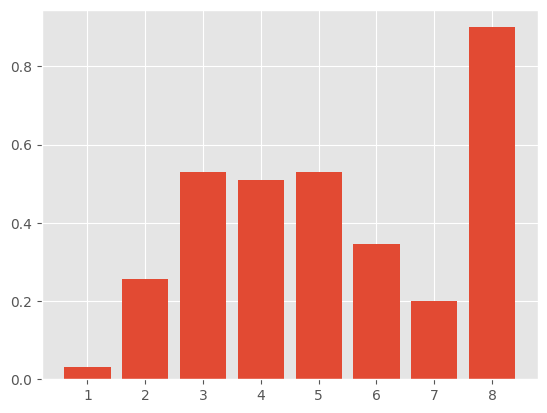



The model found several features especially useful when predicting player rank. Among them were APM, ActionLatency and some engineered features that combined several features from the original data; they are denoted F1-F5 in the chart below.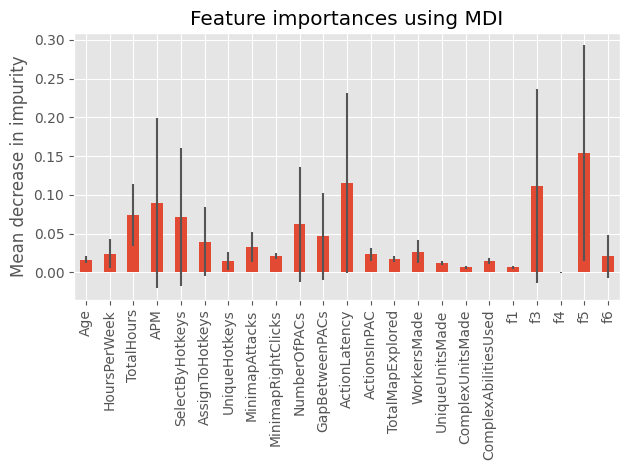

##Advice for Collecting more Data

The player ranks are naturally unbalanced which on it's own isn't necessarily a problem but combined with the small size of the original dataset can mean individual ranks are not properly represented. At a minimum, make sure to increase the number of games in the dataset for players who are at both ends of the rank spectrum, particularly ranks with LeagueIndex 1 and 7(model performed worst on these). 

Player information like TotalHours, Age and WeeklHours were missing for pro players(LeagueIndex 8). Please fill those if possible.

A really good addition to the dataset would be an associated player ID with each game instance and to have multiple games per player. I would not be suprised to see a random forest variant score very well with aggregated game data per player.

Some of the TotalHours data seemed off to me, ensuring that those are accurate would improve predictions, but I'm not sure that there is an easy way to do that.